# **Kaggle_Cat_Dog_CNN**  
This Notebook demonstrates how to build an image classification system using Convolution Neural Network (CNN). We are using the Kaggle cat vs. dog dataset, which contains ~ 25,000 images. The dataset is available at:  

https://www.kaggle.com/datasets/karakaggle/kaggle-cat-vs-dog-dataset

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
import numpy as np
import os
import random
import shutil # shell utility
from PIL import Image
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import sys
# add module 
import image_preprocessing # data preprocessing module
import model_cnn # model construction module
import evaluate # module computes metrics, generates visualizations

# Data Preprocessing

First visualzie some random images from both groups

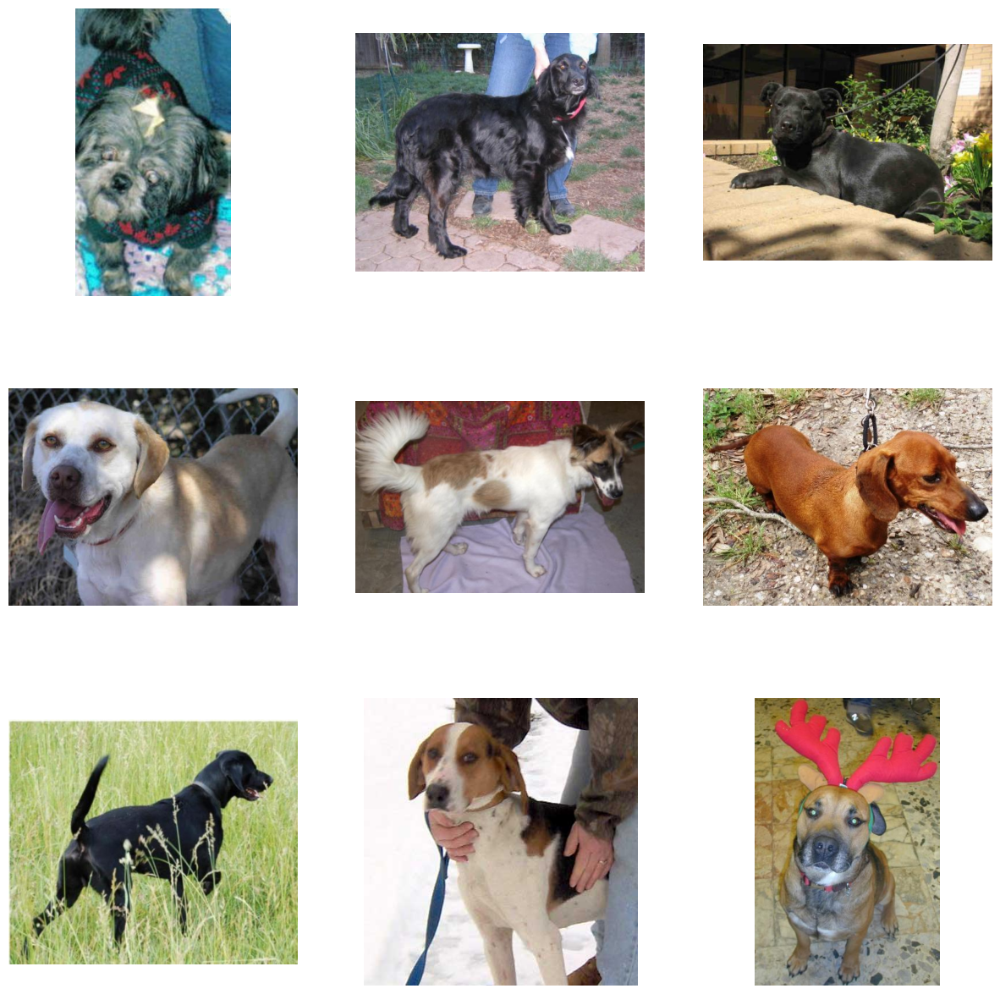

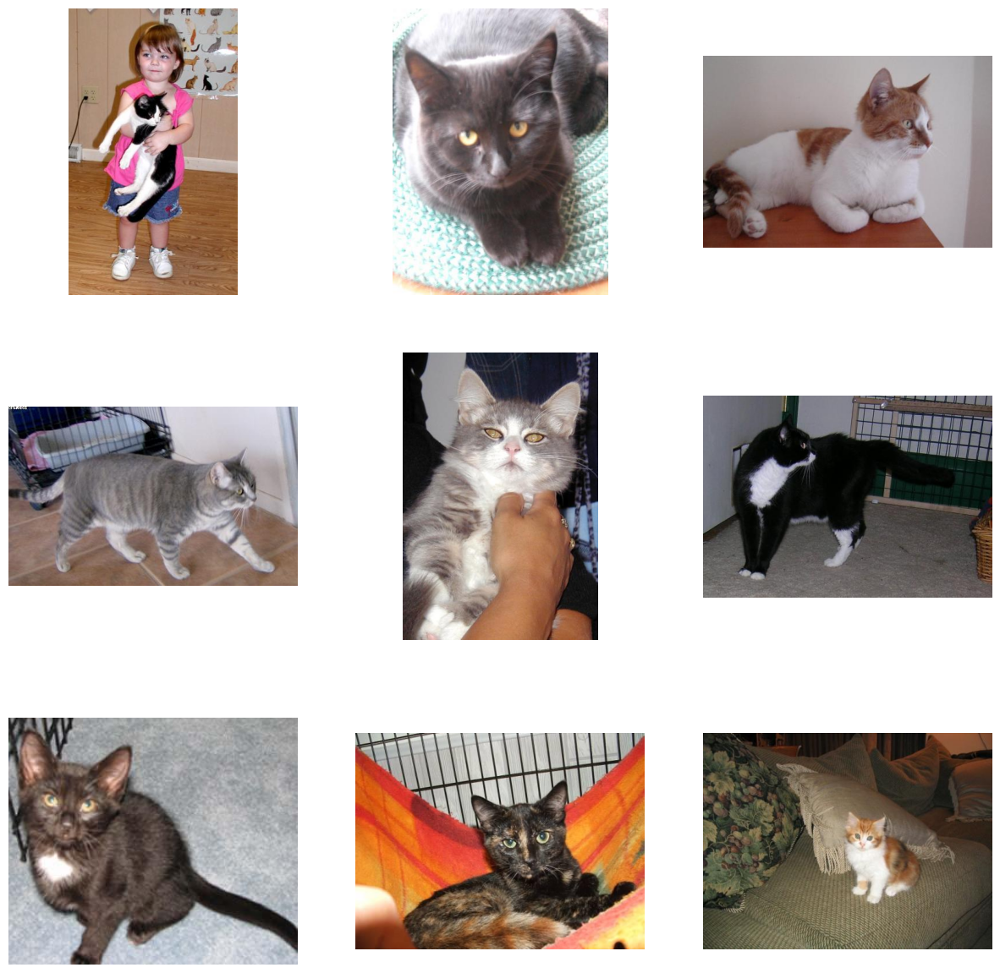

In [ ]:
pet_data_path = 'PetImages/'
dog_data_path = '/PetImages/Dog/'
cat_data_path = 'PetImages/Cat/'
dogs = os.listdir(dog_data_path)
cats = os.listdir(cat_data_path)
dog_ids = [x.split('.')[0] for x in random.sample(dogs,9)]
cat_ids = [x.split('.')[0] for x in random.sample(cats,9)]
# visuslize images of dog and cat
image_preprocessing.show_images(dog_data_path, '', dog_ids)
image_preprocessing.show_images(cat_data_path, '', cat_ids)

Always a good idea to visually inspect your dataset. You may find corrupted/mislabeled images as shown below. You can also develop a general sense of how images vary in rotation, brightness, contrast, etc., which is useful when applying image augmentation.

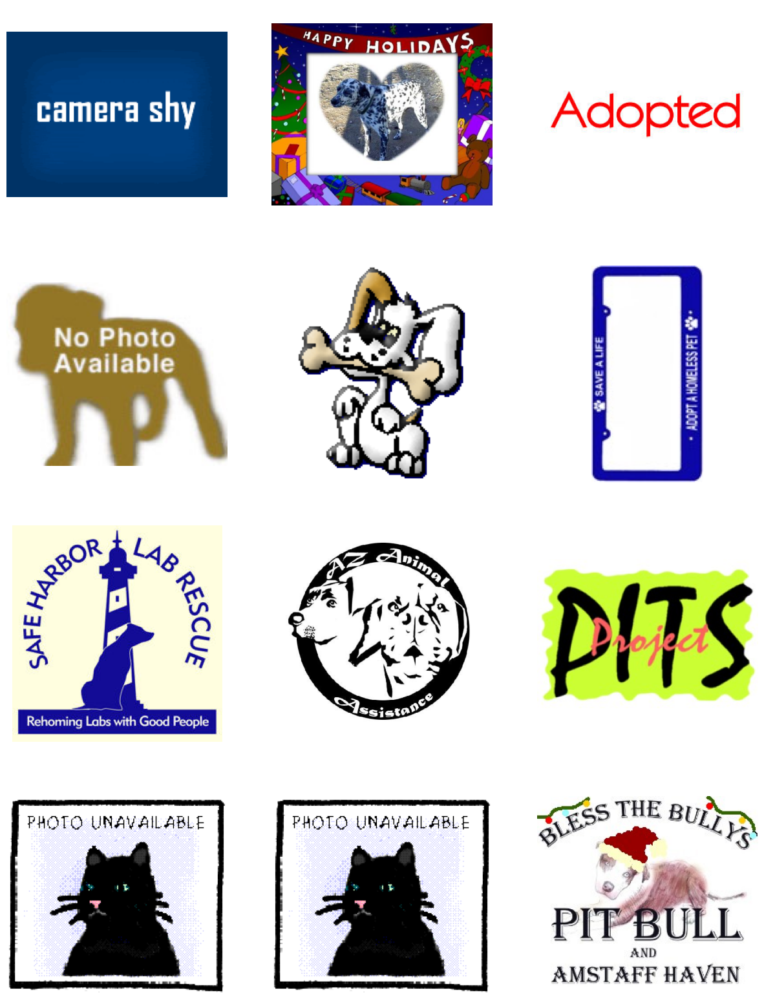

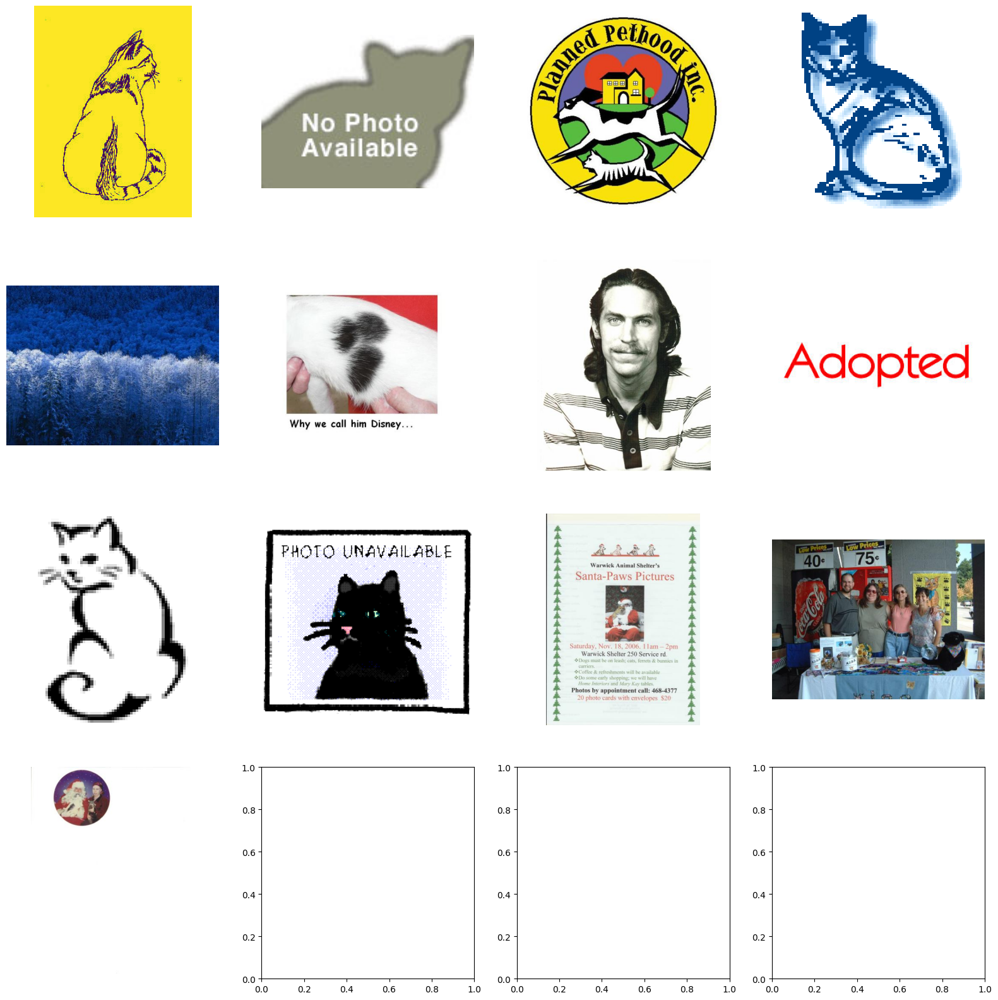

Moved /content/drive/MyDrive/PetImages/Dog/5604.jpg to /content/drive/MyDrive/PetImages/Dog/../trash
Moved /content/drive/MyDrive/PetImages/Dog/6413.jpg to /content/drive/MyDrive/PetImages/Dog/../trash
Moved /content/drive/MyDrive/PetImages/Dog/8736.jpg to /content/drive/MyDrive/PetImages/Dog/../trash
Moved /content/drive/MyDrive/PetImages/Dog/8898.jpg to /content/drive/MyDrive/PetImages/Dog/../trash
Moved /content/drive/MyDrive/PetImages/Dog/9188.jpg to /content/drive/MyDrive/PetImages/Dog/../trash
Moved /content/drive/MyDrive/PetImages/Dog/9517.jpg to /content/drive/MyDrive/PetImages/Dog/../trash
Moved /content/drive/MyDrive/PetImages/Dog/10161.jpg to /content/drive/MyDrive/PetImages/Dog/../trash
Moved /content/drive/MyDrive/PetImages/Dog/10190.jpg to /content/drive/MyDrive/PetImages/Dog/../trash
Moved /content/drive/MyDrive/PetImages/Dog/10237.jpg to /content/drive/MyDrive/PetImages/Dog/../trash
Moved /content/drive/MyDrive/PetImages/Dog/10401.jpg to /content/drive/MyDrive/PetImages

In [ ]:
# plot images that are neither cat or dog
dogs_corrupted = np.array([5604,6413,8736,8898,9188,9517,10161,10190,10237,10401,10797,11186])
cats_corrupted = np.array([2939,3216,4688,4833,5418,6215,7377,8456,8470,11565,12272,3672,10029])
image_preprocessing.show_images(dog_data_path,'',dogs_corrupted)
image_preprocessing.show_images(cat_data_path,'',cats_corrupted)
# remove those images to a trash directory
image_preprocessing.trash_files(dog_data_path,'',dogs_corrupted)
image_preprocessing.trash_files(cat_data_path,'',cats_corrupted)

Train/Dev/Test split
1. Remove any corrupted images and force 3 color channels
2. Randomly split dataset into train, validation and test sets with a ratio of 8:1:1.


In [ ]:
# Remove corrupted images
image_preprocessing.image_check(dog_data_path)
image_preprocessing.image_check(cat_data_path)
image_preprocessing.split_dataset(pet_data_path) # default values train_ratio=0.8, val_ratio=0.1, test_ratio=0.1

Invalid image mode: /content/drive/MyDrive/PetImages/Dog/9078.jpg 



/usr/local/lib/python3.11/dist-packages/PIL/TiffImagePlugin.py:950: UserWarning: Truncated File Read
  warnings.warn(str(msg))


Corrupted image: /content/drive/MyDrive/PetImages/Dog/Thumbs.db, cannot identify image file '/content/drive/MyDrive/PetImages/Dog/Thumbs.db'

Invalid image mode: /content/drive/MyDrive/PetImages/Dog/dog9188.jpg 

Invalid image mode: /content/drive/MyDrive/PetImages/Dog/dog5604.jpg 

Invalid image mode: /content/drive/MyDrive/PetImages/Dog/dog10797.jpg 

Invalid image mode: /content/drive/MyDrive/PetImages/Dog/dog10401.jpg 

Invalid image mode: /content/drive/MyDrive/PetImages/Dog/8730.jpg 

Invalid image mode: /content/drive/MyDrive/PetImages/Dog/7459.jpg 

Invalid image mode: /content/drive/MyDrive/PetImages/Dog/7969.jpg 

Invalid image mode: /content/drive/MyDrive/PetImages/Dog/6718.jpg 

Invalid image mode: /content/drive/MyDrive/PetImages/Dog/7133.jpg 

Invalid image mode: /content/drive/MyDrive/PetImages/Dog/7112.jpg 

Invalid image mode: /content/drive/MyDrive/PetImages/Dog/7369.jpg 

Invalid image mode: /content/drive/MyDrive/PetImages/Dog/5736.jpg 

Invalid image mode: /content

Creat a bar plot to see class distribution in all 3 datasets.

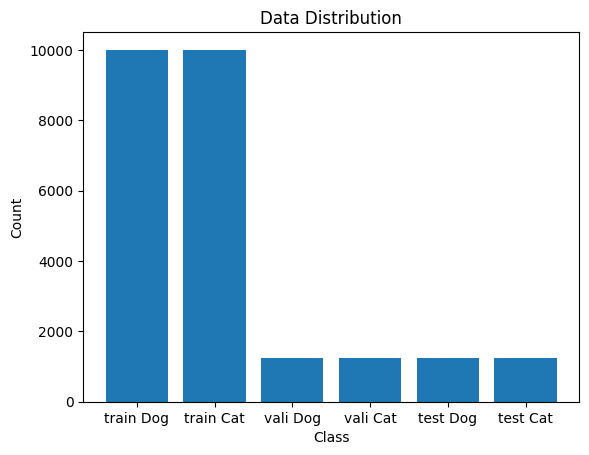

In [2]:
pet_train_path = '/content/drive/MyDrive/PetImages/train/'
pet_validation_path = '/content/drive/MyDrive/PetImages/validation/'
pet_test_path = '/content/drive/MyDrive/PetImages/test/'
# count number of images for each dataset
train_dog_count = image_preprocessing.count_images(os.path.join(pet_train_path,'Dog'))
train_cat_count = image_preprocessing.count_images(os.path.join(pet_train_path,'Cat'))
validation_dog_count = image_preprocessing.count_images(os.path.join(pet_validation_path,'Dog'))
validation_cat_count = image_preprocessing.count_images(os.path.join(pet_validation_path,'Cat'))
test_dog_count = image_preprocessing.count_images(os.path.join(pet_test_path,'Dog'))
test_cat_count = image_preprocessing.count_images(os.path.join(pet_test_path,'Cat'))
# creat a dictionary with labels and number of images
data_distribution = {'train Dog': train_dog_count,
                     'train Cat': train_cat_count,
                     'vali Dog': validation_dog_count,
                     'vali Cat': validation_cat_count,
                     'test Dog': test_dog_count,
                     'test Cat': test_cat_count}
image_preprocessing.plot_data_distribution(data_distribution)

Check distributioin of image resolutions in the validation set, which can help choosing the image size we will use for the model.

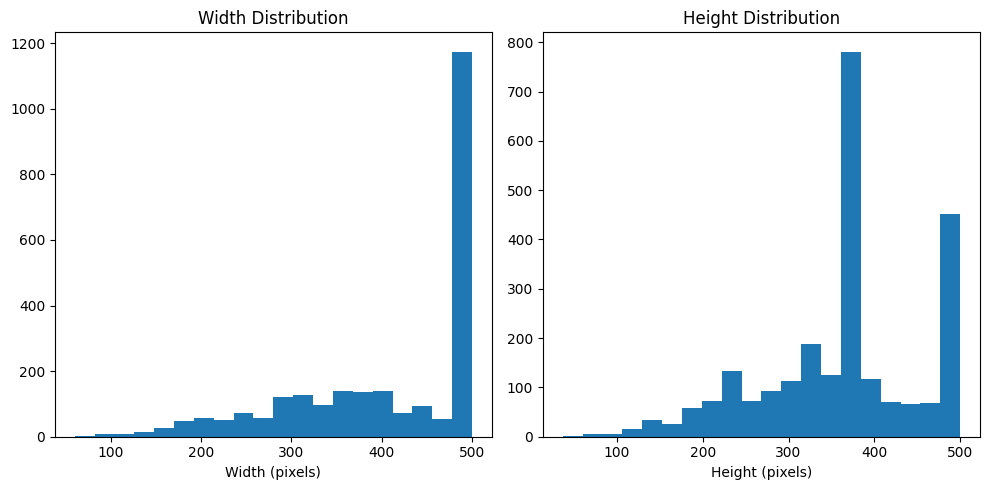

In [ ]:
# plot resolution distribution
resolutions = image_preprocessing.image_resolution(pet_validation_path)
widths, heights = zip(*resolutions) # upzip
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.hist(widths, bins=20)
plt.title("Width Distribution")
plt.xlabel("Width (pixels)")
plt.subplot(1, 2, 2)
plt.hist(heights, bins=20)
plt.title("Height Distribution")
plt.xlabel("Height (pixels)")
plt.tight_layout()
plt.show()

Load Data
1. Define image size and batch size
2. Load train/dev/test datasets

In [17]:
IMAGE_SIZE = (160,160) # 64 fast testing, 128 lightweight CNN, 160 MobileNetV2, 224 VGG16/ResNet
IMAGE_SIZE_pre = (256,256) # A larger image size for test data before augmentation to reduce blurry
BATCH_SIZE = 32

pets_train = image_dataset_from_directory(pet_train_path,batch_size=BATCH_SIZE,image_size=IMAGE_SIZE_pre,
                                          shuffle=True,label_mode='binary',seed=1,color_mode='rgb')
pets_validation = image_dataset_from_directory(pet_validation_path,batch_size=BATCH_SIZE,image_size=IMAGE_SIZE,
                                               shuffle=True,label_mode='binary',seed=1,color_mode='rgb')
pets_test = image_dataset_from_directory(pet_test_path,batch_size=BATCH_SIZE,image_size=IMAGE_SIZE,
                                         shuffle=False,label_mode='binary',color_mode='rgb')

Found 20003 files belonging to 2 classes.
Found 2499 files belonging to 2 classes.
Found 2503 files belonging to 2 classes.


# Data Augmentation
1. Define data augmentation layer and data normalization layer
2. Apply augmentation, resize, and normalization to training set. Apply normalizationi to validation and test sets
3. Force 3 color channel
4. Performance optimization

In [18]:
# 1.1 Define Data augmentation layer
augmentation_layer = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomRotation(0.05,fill_mode='reflect'),
    tf.keras.layers.RandomZoom(height_factor=(-0.2,0.2), width_factor=(-0.2,0.2),fill_mode='reflect'),
    tf.keras.layers.RandomShear(0.1,fill_mode='reflect'),
    tf.keras.layers.RandomTranslation(0.1,0.2,fill_mode='reflect'),
    #tf.keras.layers.RandomContrast(0.1),
    tf.keras.layers.RandomBrightness(0.1) # value_range=[]
])
# 1.2 Define Data normalization layer
normalization_layer = tf.keras.layers.Rescaling(1./255)
# 2.1.1 apply data augmentation to training set
pets_train = pets_train.map(lambda x,y: (image_preprocessing.augment_image(augmentation_layer,x),y),
                            num_parallel_calls=tf.data.AUTOTUNE)
# 2.1.2 resize and normalize training set
pets_train = pets_train.map(lambda x,y: (image_preprocessing.preprocess_image(normalization_layer,x,IMAGE_SIZE),y))
# 2.2 only normalize validation and test sets
pets_validation = pets_validation.map(lambda x,y: (normalization_layer(x),y))
pets_test = pets_test.map(lambda x,y: (normalization_layer(x),y))
# 3. Force 3 channels
pets_train = pets_train.map(image_preprocessing.force_rgb)
pets_validation = pets_validation.map(image_preprocessing.force_rgb)
pets_test = pets_test.map(image_preprocessing.force_rgb)
# 4. Performance optimization, Caching and Prefetching
AUTOTUNE = tf.data.AUTOTUNE
pets_train = pets_train.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
pets_validation = pets_validation.cache().prefetch(tf.data.AUTOTUNE)
pets_test = pets_test.cache().prefetch(tf.data.AUTOTUNE)

Visualize effect of data augmentation

Number of images: 32
Number of labels: 32
Number of images: 32
Number of labels: 32
Number of images: 32
Number of labels: 32
Number of images: 32
Number of labels: 32
Number of images: 32
Number of labels: 32


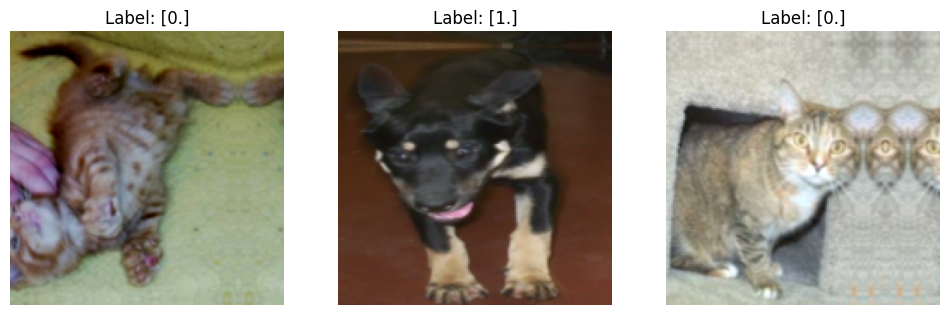

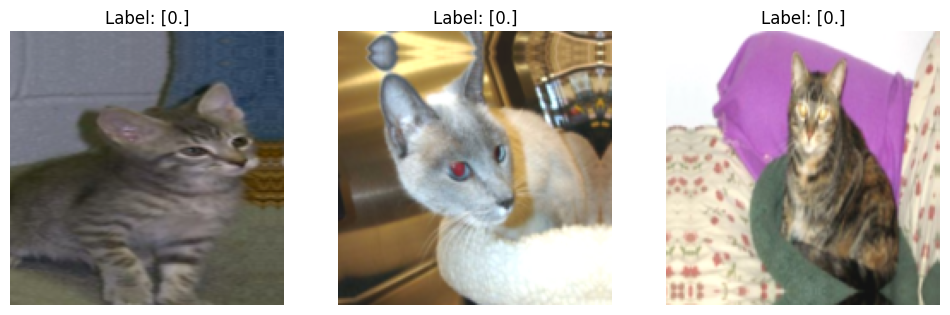

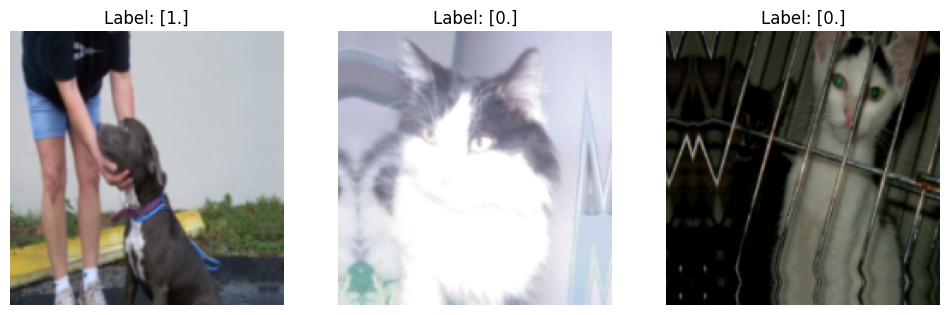

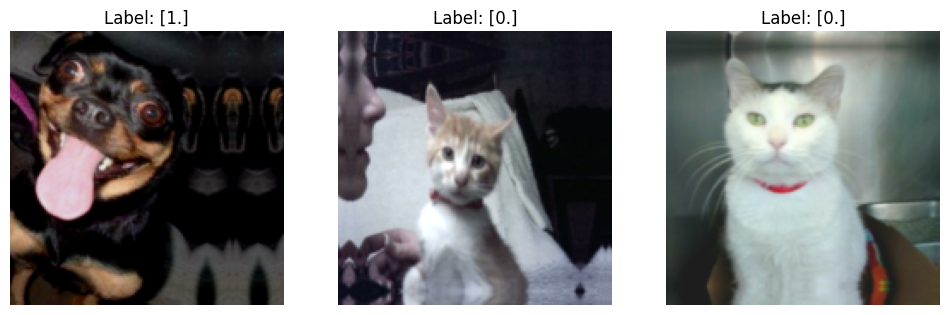

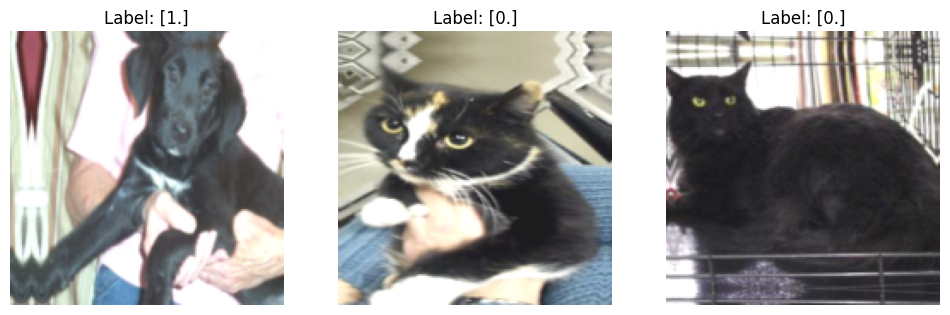

In [17]:
# plot training data after augmentation
for images, labels in pets_train.take(5):
    print(f"Number of images: {images.shape[0]}")
    print(f"Number of labels: {labels.shape[0]}")
    plt.figure(figsize=(12, 4))
    for i in range(3):
        ax = plt.subplot(1, 3, i + 1)
        plt.imshow(np.clip(images[i,:,:].numpy(), 0, 1))
        plt.title(f"Label: {labels[i].numpy()}")
        plt.axis("off")
plt.show()

# Model Construction
Model layers

Input layer, (None,IMAGE_SIZE,3)
5 Convolution blocks, each Conv_block i contains 2^(i+4) filters, ReLU activation, batch normalization, max pooling, dropout, and He's kernel initialization
Fully connected layer contains flatten layer, dense layer with 512 units and L2 regularization, and a Dropout layer.
Output layer with 1 unit and sigmoid activation

In [19]:
# Model Construction
model = model_cnn.build_model(IMAGE_SIZE)
# compile the model
model.compile(optimizer=tf.keras.optimizers.AdamW(),
              loss='binary_crossentropy',metrics=['accuracy'])
model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_15 (Conv2D)              │ (None, 160, 160, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 160, 160, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_15 (ReLU)                 │ (None, 160, 160, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 80, 80, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 80, 80, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 80, 80, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ (None, 80, 80, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_16 (ReLU)                 │ (None, 80, 80, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 40, 40, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 40, 40, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 40, 40, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_20          │ (None, 40, 40, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_17 (ReLU)                 │ (None, 40, 40, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 20, 20, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_21          │ (None, 20, 20, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_18 (ReLU)                 │ (None, 20, 20, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 10, 10, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 10, 10, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 10, 10, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_22          │ (None, 10, 10, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 8,129,217 (31.01 MB)

 Trainable params: 8,126,209 (31.00 MB)

 Non-trainable params: 3,008 (11.75 KB)

1. Apply learning rate decay
2. Apply early stopping if validation loss does not decrease after 5 epoch.
3. Run model with 30 epochs.

In [20]:
# apply learning rate decay
learning_rate_decay = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    patience=2,
    factor=0.5,
    min_lr=1e-6,
    verbose=1
)
# apply early stopping
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True)
# run the model
history = model.fit(pets_train, validation_data=pets_validation, epochs=30, callbacks=[learning_rate_decay,early_stop])

Epoch 1/30
626/626 ━━━━━━━━━━━━━━━━━━━━ 235s 58ms/step - accuracy: 0.5955 - loss: 2.7037 - val_accuracy: 0.6963 - val_loss: 0.9093 - learning_rate: 0.0010
Epoch 2/30
626/626 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step - accuracy: 0.6981 - loss: 0.8815 - val_accuracy: 0.7371 - val_loss: 0.7618 - learning_rate: 0.0010
Epoch 3/30
626/626 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step - accuracy: 0.7562 - loss: 0.7494 - val_accuracy: 0.6407 - val_loss: 1.2311 - learning_rate: 0.0010
Epoch 4/30
626/626 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step - accuracy: 0.7949 - loss: 0.7156 - val_accuracy: 0.7939 - val_loss: 0.6592 - learning_rate: 0.0010
Epoch 5/30
626/626 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step - accuracy: 0.8258 - loss: 0.6139 - val_accuracy: 0.6683 - val_loss: 1.0862 - learning_rate: 0.0010
Epoch 6/30
626/626 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step - accuracy: 0.8517 - loss: 0.5727 - val_accuracy: 0.8587 - val_loss: 0.5792 - learning_rate: 0.0010
Epoch 7/30
626/626 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step - accuracy: 0.8562 - 

# Results

1. Training/Validation loss over epochs
2. Training/Validation accuracy over epoches

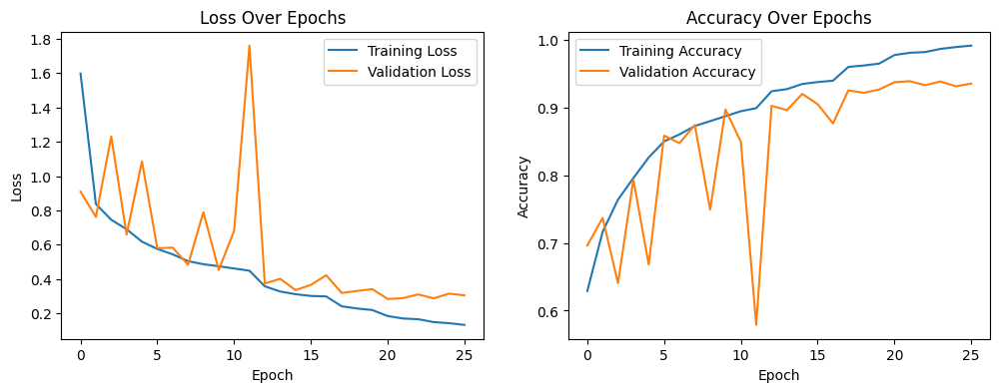

In [21]:
# Plot training history
evaluate.training_history(history)

Evaluate model on validation set

79/79 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step - accuracy: 0.9418 - loss: 0.2746
Validation Loss: 0.25975358486175537, Validation Accuracy: 0.9507803320884705
79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step
Validation Metrics:
Precision: 0.9462
Recall: 0.9560
F1-Score: 0.9511


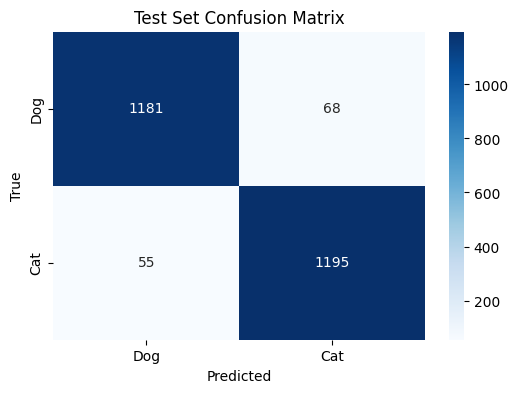

In [ ]:
# Evaluate on validation set
# train_loss, train_accuracy = model.evaluate(pets_train)
val_loss, val_accuracy = model.evaluate(pets_validation)
print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")
# get prediction
threshold = 0.5
y_predict = (model.predict(pets_validation) > threshold).astype(int)
y_true = np.concatenate([y.numpy() for _,y in pets_validation])
# Compute metrics
print("Validation Metrics:")
print(f"Precision: {precision_score(y_true, y_predict):.4f}")
print(f"Recall: {recall_score(y_true, y_predict):.4f}")
print(f"F1-Score: {f1_score(y_true, y_predict):.4f}")
cm = confusion_matrix(y_true, y_predict)
# plot confusion matrix
evaluate.confusion_matrix(cm,'Validation')

Evaluate model on test set

79/79 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.9507 - loss: 0.3024
Test Loss: 0.26981934905052185, Test Accuracy: 0.9536556005477905
79/79 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Test Metrics:
Precision: 0.9544
Recall: 0.9529
F1-Score: 0.9536


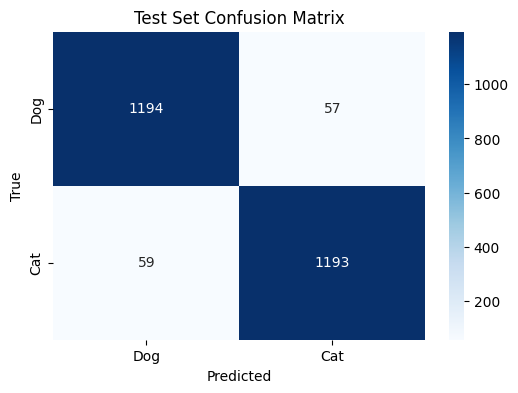

In [ ]:
# Evaluate on test set
test_loss, test_accuracy = model.evaluate(pets_test)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")
# get prediction
y_predict = (model.predict(pets_test) > threshold).astype(int)
y_true = np.concatenate([y.numpy() for _,y in pets_test])
# Compute metrics
print("Test Metrics:")
print(f"Precision: {precision_score(y_true, y_predict):.4f}")
print(f"Recall: {recall_score(y_true, y_predict):.4f}")
print(f"F1-Score: {f1_score(y_true, y_predict):.4f}")
cm = confusion_matrix(y_true, y_predict)
# plot confusion matrix
evaluate.confusion_matrix(cm,'Test')

Calculate class-specific recall. Plot mislabelled data for error analysis

Dog Recall: 0.9544
Cat Recall: 0.9529
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━

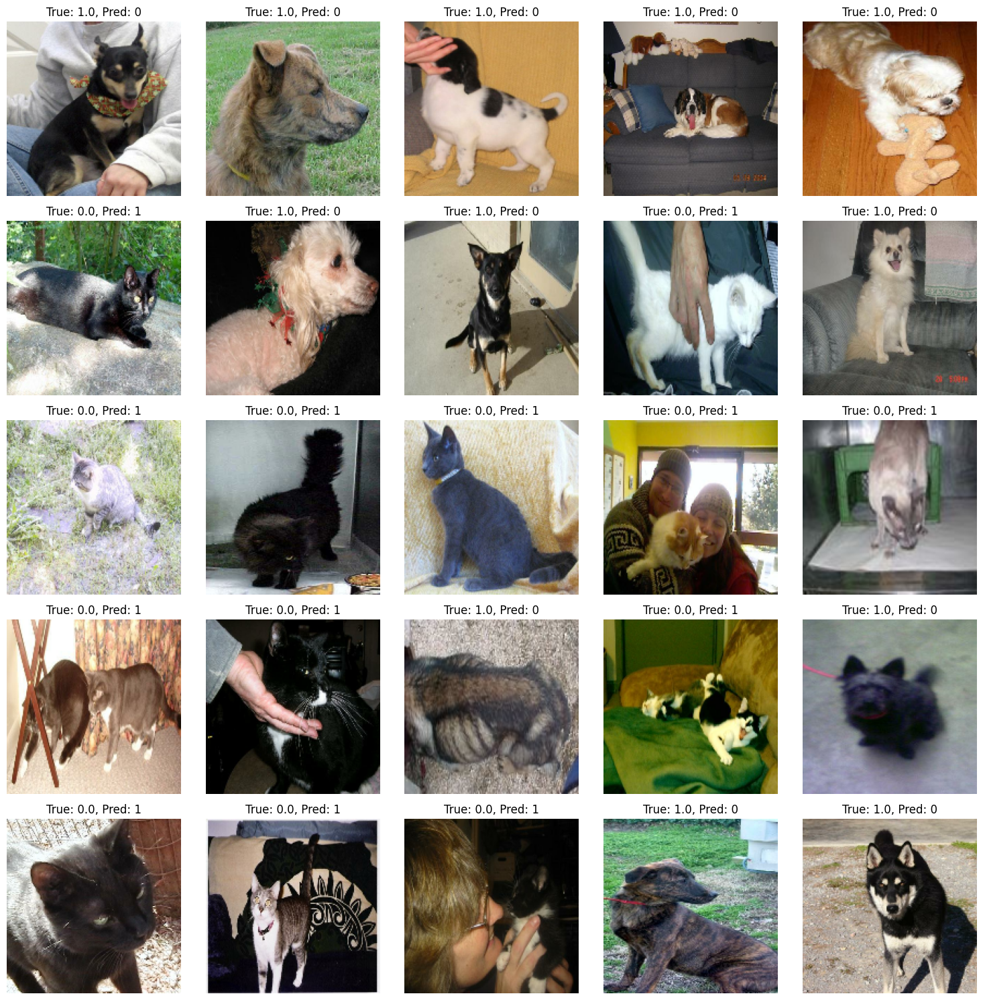

In [ ]:
# Class-specific recall
dog_recall = cm[0, 0] / (cm[0, 0] + cm[0, 1])  # Dogs correctly classified / Total dogs
cat_recall = cm[1, 1] / (cm[1, 0] + cm[1, 1])  # Cats correctly classified / Total cats
print(f"Dog Recall: {dog_recall:.4f}")
print(f"Cat Recall: {cat_recall:.4f}")
evaluate.plot_misclassified(model,pets_test)

# Conclusion
The convolution neural network (CNN) model achieves a test F1 score of 0.9536, with dog test recall (0.9544) and cat test recall (0.9529). The model weights and structure is shared in file Cat_Dog_CNN_model.keras 
You can load the model with tf.keras.models.load_model(Cat_Dog_CNN_model.keras) and try for yourself. 